# Setup

In [1]:
# === Standard Library ===
import os
import sys
from datetime import datetime

# === Scientific Computing ===
import numpy as np
from sklearn.mixture import GaussianMixture

# === Torch & TorchVision ===
import torch
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.utils import make_grid

# === Plotting ===
import matplotlib.pyplot as plt
%matplotlib inline

# === Progress Bar ===
from tqdm import tqdm

# === CRP & Zennit ===
import zennit.image as zimage
from crp.image import imgify
from crp.concepts import ChannelConcept
from crp.helper import get_layer_names

# === Local Project Modules ===
sys.path.append("..")  # Temporary path extension for imports

from src.glocal_analysis import run_analysis 
from src.datasets.flood_dataset import FloodDataset
from src.plot_pcx_explanations import plot_pcx_explanations
from src.minio_client import MinIOClient

# === LCRP Utilities ===
from LCRP.models import get_model
from LCRP.utils.crp_configs import ATTRIBUTORS, CANONIZERS, VISUALIZATIONS, COMPOSITES


In [2]:
# Define transformation (if needed)
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert to tensor
])

# Load dataset
root_dir = "../datasets/data/General_Flood_v3/"
dataset = FloodDataset(root_dir=root_dir, split="train", transform=transform)

model_name = "unet"
device = "cuda" if torch.cuda.is_available() else "cpu"
output_dir_crp = "output/crp/unet_flood/"

# Loading unet with path to checkpoint
model = get_model(model_name=model_name, classes=2, ckpt_path="../models/checkpoints/unet_flood_modified.pt")

Loaded checkpoint ../models/checkpoints/unet_flood_modified.pt


# Running and saving attributions of our dataset per layer

You don't need to run it if PCX results are already saved!!! 

In [21]:
dataloader = DataLoader(dataset, batch_size=4, shuffle=False, num_workers=8)
cc = ChannelConcept()

layer_names = get_layer_names(model, [torch.nn.Conv2d])
# Setting up CRP 
attribution = ATTRIBUTORS["unet"](model)
composite = COMPOSITES[model_name](canonizers=[CANONIZERS[model_name]()])
condition = [{"y": 1}]    
fv = VISUALIZATIONS[model_name](attribution,
                                dataset,
                                layer_names,
                                preprocess_fn=lambda x: x,
                                path=output_dir_crp,
                                max_target="max")

# Runs faster on MPS
device = "mps"
model.to(device)

start = datetime.now()

activations = {}
attributions = {}
for i, (x, y) in enumerate(tqdm(dataset)):
    x = x.to(device).requires_grad_()
    condition = [{"y": 1}]
    attr = attribution(x.unsqueeze(0), condition, composite, record_layer=layer_names)

    for layer_name in layer_names:
        if layer_name not in attributions.keys():
            attributions[layer_name] = []
            activations[layer_name] = []
        activations[layer_name].append(attr.activations[layer_name].amax((-2, -1)))
        attributions[layer_name].append(cc.attribute(attr.relevances[layer_name], abs_norm=True))

for layer_name in layer_names:
    attributions[layer_name] = torch.cat(attributions[layer_name])
    activations[layer_name] = torch.cat(activations[layer_name])    
    folder = f"output/pcx/unet_flood/{layer_name}/"
    # attributions[layer_name] = torch.cat(attributions[layer_name])
    # activations[layer_name] = torch.cat(activations[layer_name])
    os.makedirs(folder, exist_ok=True)
    np.save(folder + "attributions", attributions[layer_name].cpu().numpy())
    np.save(folder + "activations", activations[layer_name].cpu().numpy())
end = datetime.now()

100%|██████████| 1055/1055 [05:25<00:00,  3.24it/s]


In [15]:
attributions[layer_name].shape

torch.Size([1055, 512])

# Fitting GMM - Clustering Attributions - Already done

Here for each layer we can fit an GMM and check how many components we want for cluster

In [84]:
# Loading
layer_names = get_layer_names(model, [torch.nn.Conv2d])
layer_name = layer_names[10]
print(layer_name)
folder = f"output/pcx/unet_flood/{layer_name}/"
attributions = torch.from_numpy(np.load(folder + "attributions.npy"))
activations = torch.from_numpy(np.load(folder + "activations.npy"))
indices = np.arange(len(dataset))

num_prototypes = {
    "encoder.features.0": 4,
    "encoder.features.2": 4,
    "encoder.features.5": 6,
    "encoder.features.7": 2,
    "encoder.features.10": 2,
    "encoder.features.12": 2,
    "encoder.features.15": 4,
    "encoder.features.17": 4,
    "encoder.features.20": 3,
    "encoder.features.22": 4,
    "decoder.center.0.0": 6,
    "decoder.center.1.0": 5,
    "decoder.blocks.0.conv1.0": 5,
    "decoder.blocks.0.conv2.0": 3,
    "decoder.blocks.1.conv1.0": 3,
    "decoder.blocks.1.conv2.0": 3,
    "decoder.blocks.2.conv1.0": 5,
    "decoder.blocks.2.conv2.0": 3,
    "decoder.blocks.3.conv1.0": 5,
    "decoder.blocks.3.conv2.0": 3,
    "decoder.blocks.4.conv1.0": 3,
    "decoder.blocks.4.conv2.0": 4,
}

decoder.center.0.0


In [85]:
from umap import UMAP

embedding_attr = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_attr = embedding_attr.fit_transform(attributions.detach().cpu().numpy())
x_attr, y_attr = X_attr[:, 0], X_attr[:, 1]

embedding_act = UMAP(n_neighbors=5, random_state=123, n_jobs=1)
X_act = embedding_act.fit_transform(activations.detach().cpu().numpy())
x_act, y_act = X_act[:, 0], X_act[:, 1]

/Users/golimblevskaia/Documents/code/FHHI-XAI/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/golimblevskaia/Documents/code/FHHI-XAI/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


/Users/golimblevskaia/Documents/code/FHHI-XAI/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/golimblevskaia/Documents/code/FHHI-XAI/.venv/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/var/folders/pz/9xtgdh150n7dbrr_vfbbr4tr0000gq/T/ipykernel_9934/419650364.py:38: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


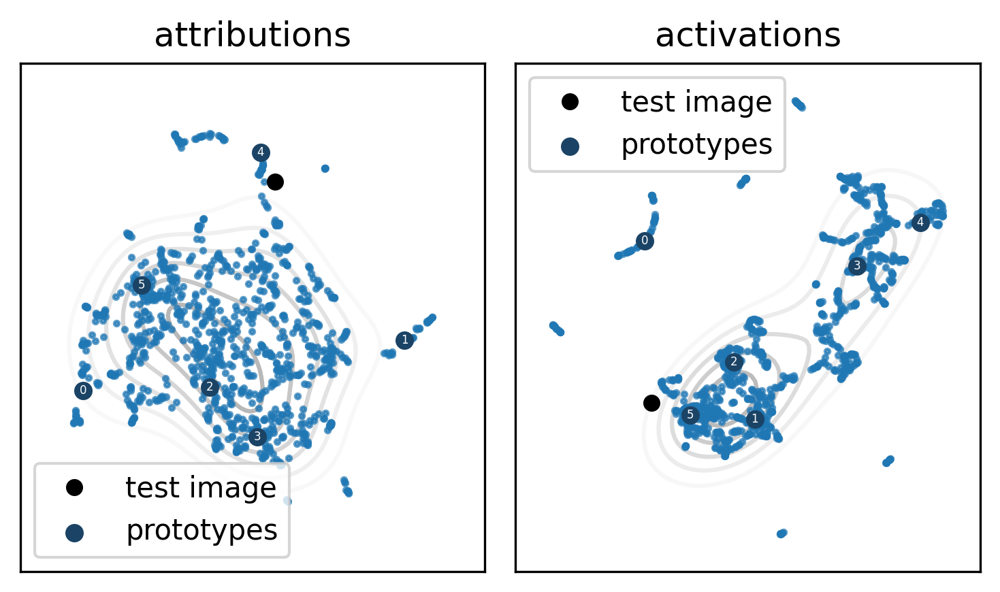

In [86]:
from scipy import stats

N_PROTOTYPES = num_prototypes[layer_name]

fig, axes = plt.subplots(1, 2, dpi=300, figsize=(5, 3), facecolor='white')
for i, X in enumerate([X_attr, X_act]):
    x, y = X[:, 0], X[:, 1]
    xmin = x.min() - 2
    xmax = x.max() + 2
    ymin = y.min() - 2
    ymax = y.max() + 2
    X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    values = np.vstack([x, y])
    kernel = stats.gaussian_kde(values, 0.5)
    Z = np.reshape(kernel(positions).T, X.shape).T
    axes[i].contour(Z, extent=[xmin, xmax, ymin, ymax], cmap="Greys", alpha=0.3, extend='min', vmax=Z.max() * 1, zorder=0)
    axes[i].scatter(x, y, s=3, alpha=0.7, zorder=1)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_title(["attributions", "activations"][i])
    axes[i].plot([1], y[1], 'ko', markersize=5, label="test image")
    axes[i].legend()


prototypes = []
gmms = []
for i, (X, emb) in enumerate([(attributions, embedding_attr), (activations, embedding_act)]):
    gmms.append(GaussianMixture(n_components=N_PROTOTYPES, random_state=0).fit(X.detach().cpu().numpy()))
    prototypes.append(gmms[-1].means_)
    mean = emb.transform(gmms[-1].means_)
    axes[i].scatter(mean[:, 0], mean[:, 1], s=30, c="#1B4365", zorder=2, label="prototypes")
    for k, prot in enumerate(mean):
        axes[i].text(prot[0], prot[1], k, fontsize=4, color="white", ha="center", va="center")
    axes[i].legend()

plt.tight_layout()
fig.show()

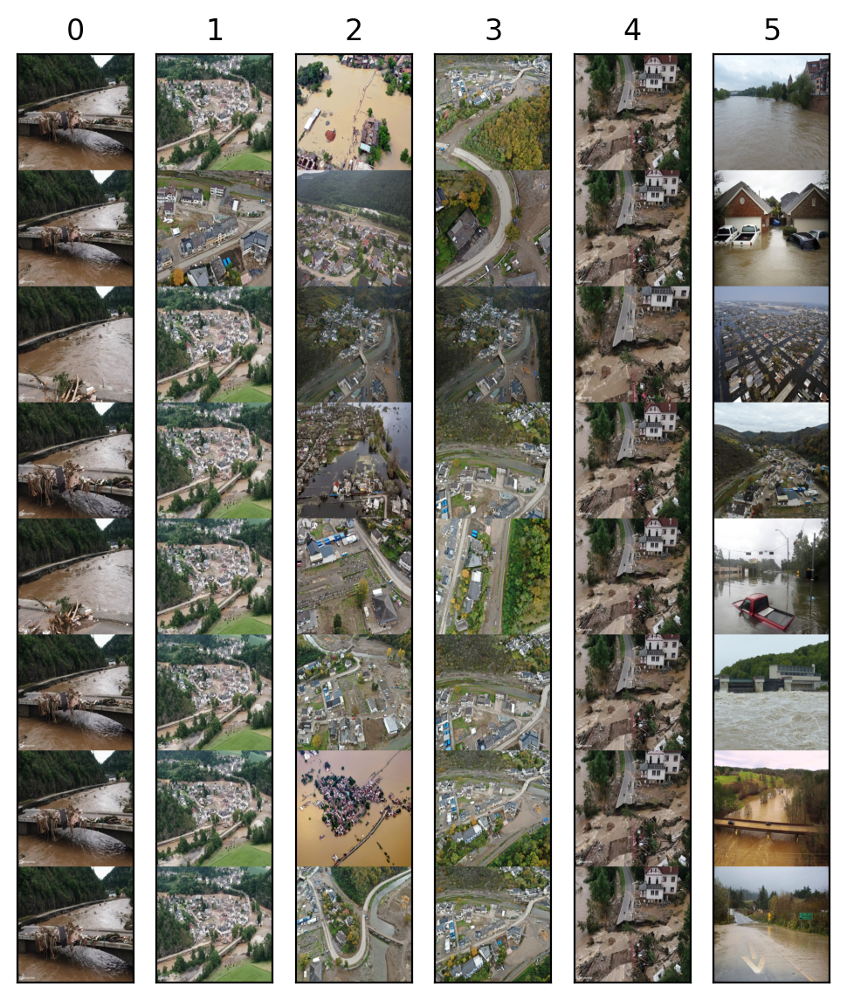

In [87]:
proto_attr = prototypes[0]

distances = np.linalg.norm(attributions[:, None, :].detach().cpu() - proto_attr, axis=2)
prototype_samples = np.argsort(distances, axis=0)[:8]
prototype_samples = indices[prototype_samples]

fig, axs = plt.subplots(1, N_PROTOTYPES, figsize=(1*N_PROTOTYPES, 8), dpi=200, facecolor='white')


for i in range(N_PROTOTYPES):
    grid = make_grid(
        [dataset[prototype_samples[j][i]][0] for j in range(8)],
        nrow=1,
        padding=0)
    grid = np.array(zimage.imgify(grid.detach().cpu()))
    img = imgify(grid)
    axs[i].imshow(img)
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_title(f"{i}")


/var/folders/pz/9xtgdh150n7dbrr_vfbbr4tr0000gq/T/ipykernel_9934/3909648300.py:47: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:205.)
  [resize(torch.from_numpy(np.asarray(i)).permute((2, 0, 1))) for i in ref_imgs[top_concepts[i]]],


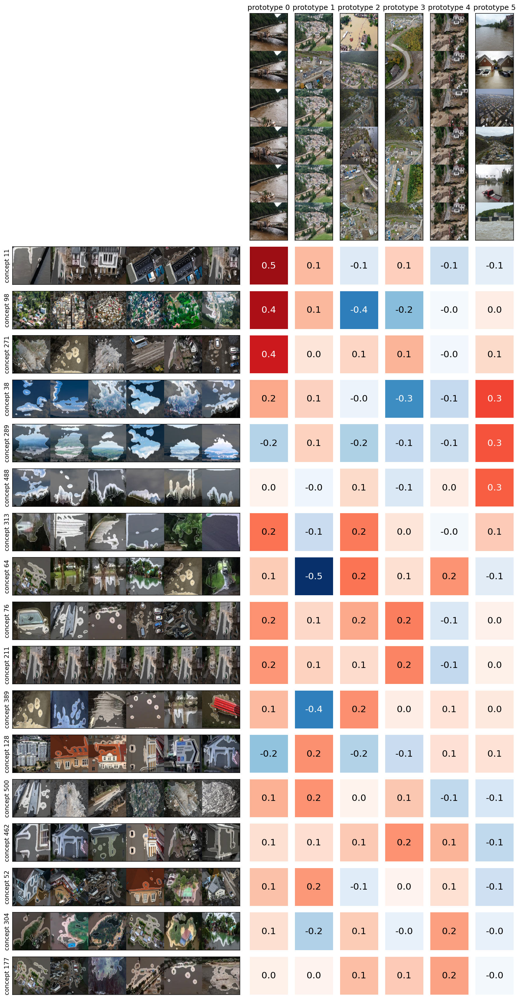

In [90]:
from LCRP.utils.render import vis_opaque_img_border
import torchvision

proto = torch.from_numpy(proto_attr)
top_concepts = torch.topk(proto, 3).indices.flatten().unique()
top_concepts = top_concepts[proto[:, top_concepts].amax(0).argsort(descending=True)].tolist()
concept_matrix = proto[:, top_concepts].T
N_CONCEPTS = len(top_concepts)

n_refimgs = 12
ref_imgs = fv.get_max_reference(top_concepts, "decoder.center.0.0", "relevance", (0, 6), composite=composite, rf=True,
                                    plot_fn=vis_opaque_img_border, batch_size=6)

fig, axs = plt.subplots(nrows=N_CONCEPTS + 1, ncols=N_PROTOTYPES + 1, figsize=(N_PROTOTYPES + 6, N_CONCEPTS + 6), dpi=150,
                        gridspec_kw={'width_ratios': [6] + [1 for _ in range(N_PROTOTYPES)],
                                     'height_ratios': [6] + [1 for _ in range(N_CONCEPTS)]})
for i in range(N_CONCEPTS):
    for j in range(N_PROTOTYPES):
        val = concept_matrix[i, j].item()
        axs[i + 1, j + 1].matshow(np.ones((1, 1)) * val if val >= 0 else np.ones((1, 1)) * val * -1,
                                  vmin=0,
                                  vmax=concept_matrix.abs().max(),
                                  cmap="Reds" if val >= 0 else "Blues")
        minmax = concept_matrix.abs().max() * 100 / 2
        cos = val * 100
        color = "white" if abs(cos) > minmax else "black"
        axs[i + 1, j + 1].text(0, 0, f"{cos:.1f}", ha="center", va="center", color=color, fontsize=15)
        axs[i + 1, j + 1].axis('off')
resize = torchvision.transforms.Resize((120, 120))
for i in range(N_PROTOTYPES):
    grid = make_grid(
        [resize(dataset[prototype_samples[j][i]][0])
         for j in range(6)],
        nrow=1,
        padding=0)
    grid = np.array(zimage.imgify(grid.detach().cpu()))
    img = imgify(grid)
    axs[0, i + 1].imshow(img)
    axs[0, i + 1].set_xticks([])
    axs[0, i + 1].set_yticks([])
    axs[0, i + 1].set_title(f"prototype {i}")
    axs[0, 0].axis('off')


for i in range(N_CONCEPTS):
    grid = make_grid(
        [resize(torch.from_numpy(np.asarray(i)).permute((2, 0, 1))) for i in ref_imgs[top_concepts[i]]],
        # [resize(torch.from_numpy(np.asarray(i)).permute((0, 1, 2))) for i in ref_imgs[topk_ind[i]]],
        nrow=int(6 / 1),
        padding=0)
    grid = np.array(zimage.imgify(grid.detach().cpu()))
    axs[i + 1, 0].imshow(grid)
    axs[i + 1, 0].set_ylabel(f"concept {top_concepts[i]}")
    axs[i + 1, 0].set_yticks([])
    axs[i + 1, 0].set_xticks([])

plt.tight_layout()
plt.show()

In [33]:
import joblib
# Training and saving all GMMs
cache_path = "output/pcx/gmms/"
prototype_cache_path = "output/pcx/gmm_prototypes/"

os.makedirs(cache_path, exist_ok=True)
os.makedirs(prototype_cache_path, exist_ok=True)

start = datetime.now()
for layer_name in layer_names[:-1]:
    if os.path.exists(cache_path + layer_name + ".pkl") and os.path.exists(prototype_cache_path + layer_name + ".pkl"):
        # Load the GMM and individual GMMs from the cache files
        gmm = joblib.load(cache_path + layer_name + ".pkl")
        prototype_gmms = joblib.load(prototype_cache_path + layer_name + ".pkl")
    else:
        # Load attributions
        folder = f"output/pcx/unet_flood/{layer_name}/"
        attributions = torch.from_numpy(np.load(folder + "attributions.npy")) 
        # Fit the GMM
        gmm = GaussianMixture(n_components=num_prototypes[layer_name], reg_covar=1e-5, random_state=0).fit(attributions)
        # Save the GMM and individual GMMs to cache files
        joblib.dump(gmm, cache_path + layer_name + ".pkl")

        # Create individual GMMs for each prototype and store them in a list
        prototype_gmms = [GaussianMixture(n_components=1, covariance_type='full',) for p in range(num_prototypes[layer_name])]
        for p, g_ in enumerate(prototype_gmms):
            g_._set_parameters([
                param[p:p + 1] if j > 0 else param[p:p + 1] * 0 + 1
                for j, param in enumerate(gmm._get_parameters())])
            
        joblib.dump(prototype_gmms, prototype_cache_path + layer_name + ".pkl")
end = datetime.now()

# PCX explanations

In [18]:
num_prototypes = {
    "encoder.features.0": 4,
    "encoder.features.2": 4,
    "encoder.features.5": 6,
    "encoder.features.7": 2,
    "encoder.features.10": 2,
    "encoder.features.12": 2,
    "encoder.features.15": 4,
    "encoder.features.17": 4,
    "encoder.features.20": 3,
    "encoder.features.22": 4,
    "decoder.center.0.0": 6,
    "decoder.center.1.0": 5,
    "decoder.blocks.0.conv1.0": 5,
    "decoder.blocks.0.conv2.0": 3,
    "decoder.blocks.1.conv1.0": 3,
    "decoder.blocks.1.conv2.0": 3,
    "decoder.blocks.2.conv1.0": 5,
    "decoder.blocks.2.conv2.0": 3,
    "decoder.blocks.3.conv1.0": 5,
    "decoder.blocks.3.conv2.0": 3,
    "decoder.blocks.4.conv1.0": 3,
    "decoder.blocks.4.conv2.0": 4,
}

Reference image file does not exist, calculating all.


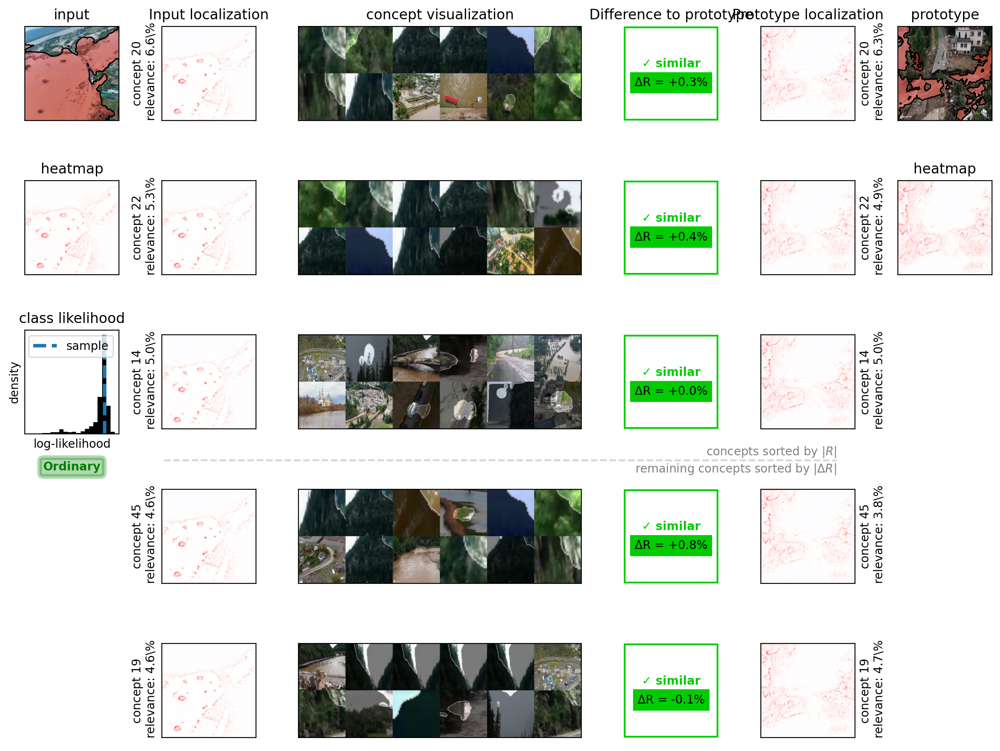

In [23]:
layer_name = "decoder.blocks.2.conv2.0"
model.to("cpu")

plot_pcx_explanations("unet", model, dataset, sample_id=61, n_concepts=5, num_prototypes=num_prototypes[layer_name], layer_name=layer_name)

In [ ]:
from datetime import datetime
# model.to("cpu")
layer_name = "decoder.center.0.0"


sec = []

import logging

logger = logging.getLogger()  # root logger
logger.setLevel(logging.DEBUG)

# Clear previous handlers
if logger.hasHandlers():
    logger.handlers.clear()

# Create file handler
file_handler = logging.FileHandler('debug_log_d_c_0_0_1.txt')
file_handler.setLevel(logging.DEBUG)

# Create formatter and set it
formatter = logging.Formatter('%(levelname)s:%(name)s:%(message)s')
file_handler.setFormatter(formatter)

# Add the file handler to logger
logger.addHandler(file_handler)

for i in range(100):
    sec.append(plot_pcx_explanations("unet", model, dataset, sample_id=i, n_concepts=5, num_prototypes=num_prototypes[layer_name], layer_name=layer_name))



In [33]:
import re

# Step 1: Read the log file
with open('debug_log_unet_gpu.txt', 'r') as f:
    lines = f.readlines()

# Step 2: Extract timing info
ratios = []
pred_times = []
back_times = []
full_times = []
for line in lines:
    if 'Prediction time' in line:
        # Extract the three timing values using regex
        match = re.search(r'Prediction time: ([\d\.]+), Backward time: ([\d\.]+), Full attribution time: ([\d\.]+)', line)
        if match:
            pred_time = float(match.group(1))
            back_time = float(match.group(2))
            full_time = float(match.group(3))

            pred_times.append(pred_time)
            back_times.append(back_time)
            full_times.append(full_time)
            if pred_time > 0:  # To avoid division by zero
                ratio = back_time / pred_time
                ratios.append(ratio)

# Step 3: Calculate the average
if ratios:
    average_ratio = sum(ratios[1:]) / len(ratios[1:])
    print(f"Average (Backward Time / Prediction Time): {average_ratio:.4f}")
    print(f"Average predictions: {np.array(pred_times[1:]).mean()}, Average Backward time: {np.array(back_times[1:]).mean()}, Average full attribution time:{ np.array(full_times[1:]).mean()}")
else:
    print("No matching log entries found.")

Average (Backward Time / Prediction Time): 2.9875
Average predictions: 0.011685466047507434, Average Backward time: 0.02295813488600841, Average full attribution time:0.02364767735926949
